## Subplots

In [16]:
import numpy as np
from matplotlib import pyplot as plt
from typing import Tuple, List, Optional


def show_image(
    image: np.ndarray,
    title: Optional[str] = None,
    fig_size: Tuple[int, int] = (10, 10),
    axis: bool = False,
    show_image: bool = True,
):
    """
    A function to plot an image.

    Args:
    image: Image to plot.
    title: Title of the image.
    fig_size: Size of the figure.
    cmap: Colormap for the image.
    axis: Whether to show axis or not.

    Returns:
    fig: Figure object.

    """
    fig, ax = plt.subplots(figsize=fig_size)
    ax.imshow(image, vmax=255, vmin=0)
    if title:
        ax.set_title(title)
    if not axis:
        ax.axis("off")
    plt.tight_layout()

    if show_image:
        plt.show()
    return fig


def subplot_images(
    image: List[np.ndarray],
    titles: Optional[List[str]] = None,
    fig_size: Tuple[int, int] = (10, 10),
    order: Tuple[int, int] = (1, -1),
    axis: bool = False,
    show: bool = False,
):
    """
    A function to plot multiple images in a subplot.

    Args:
    image: List of images to plot.
    titles: List of titles for each image.
    fig_size: Size of the figure.
    cmap: Colormap for the images.
    order: Tuple of number of rows and columns for the subplot.
    axis: Whether to show axis or not.

    Returns:
    fig: Figure object.

    """

    if len(image) == 1:
        return show_image(
            image[0],
            titles[0] if titles else None,
            fig_size if fig_size else (5, 5),
            axis,
        )

    order = (
        (order[0], len(image) // order[0])
        if order[1] == -1
        else (len(image) // order[1], order[1]) if order[0] == -1 else order
    )

    fig, axs = plt.subplots(order[0], order[1], figsize=fig_size)
    if order[0] == 1 and order[1] == 1:
        axs = np.array([axs])
    for i, ax in enumerate(axs.flatten()):
        ax.imshow(image[i], vmax=255, vmin=0)
        if titles:
            ax.set_title(titles[i])
        if not axis:
            ax.axis("off")
    if show:
        plt.show()
    return fig

## Method for SIFT

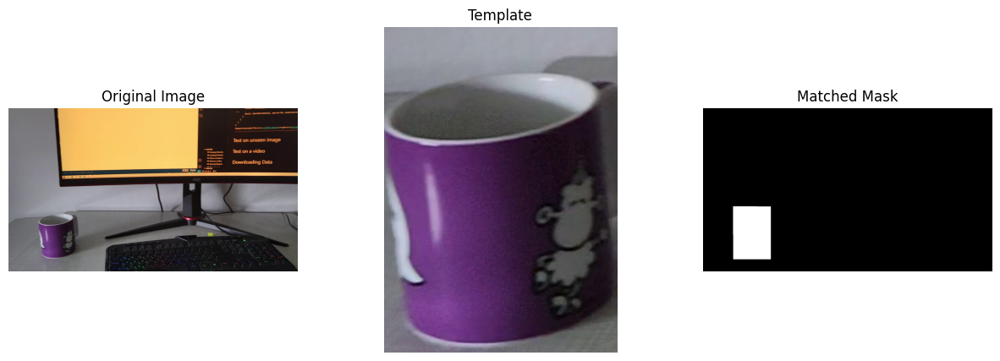

In [ ]:
import cv2

def get_sift_match_mask(original_image, template_query, min_matches=4):
    """
    Matches a template to an original image using SIFT and returns a mask of the matched region.

    Parameters:
        original_image (numpy.ndarray): The original image where the template is to be matched.
        template_query (numpy.ndarray): The template image to be matched.
        min_matches (int): Minimum number of matches required to consider it a valid match.
        threshold (float): Threshold for considering a match in template matching (default is 0.8).

    Returns:
        numpy.ndarray: A binary mask of the same size as the original image, with the matched region marked as 1.
                      If no match is found, returns a zeroed mask.
    """
    # Convert images to grayscale if necessary
    gray_original = (
        cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
        if len(original_image.shape) == 3
        else original_image
    )
    gray_template = (
        cv2.cvtColor(template_query, cv2.COLOR_BGR2GRAY)
        if len(template_query.shape) == 3
        else template_query
    )

    # Initialize the SIFT detector
    sift = cv2.SIFT_create()

    # Detect keypoints and compute descriptors
    kp1, des1 = sift.detectAndCompute(gray_original, None)
    kp2, des2 = sift.detectAndCompute(gray_template, None)

    if des1 is None or des2 is None:
        print("No keypoints detected in one of the images!")
        return np.zeros(
            (original_image.shape[0], original_image.shape[1]), dtype=np.uint8
        )

    # Use FLANN-based matcher
    index_params = dict(algorithm=1, trees=5)  # KDTree algorithm for faster search
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # Match descriptors using KNN
    matches = flann.knnMatch(des2, des1, k=2)

    # Apply Lowe's ratio test to find good matches
    good_matches = [m for m, n in matches if m.distance < 0.75 * n.distance]

    if len(good_matches) < min_matches:
        print(f"Not enough good matches found: {len(good_matches)}")
        return np.zeros(
            (original_image.shape[0], original_image.shape[1]), dtype=np.uint8
        )

    # Get the coordinates of the matched points
    src_pts = np.float32([kp2[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp1[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # Compute the homography using RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    if H is None:
        print("Homography computation failed!")
        return np.zeros(
            (original_image.shape[0], original_image.shape[1]), dtype=np.uint8
        )

    # Get the height and width of the template
    h, w = template_query.shape[:2]
    template_mask = np.ones(
        (h, w), dtype=np.uint8
    )  # Create a mask the size of the template

    # Warp the template mask to the perspective of the original image
    warped_mask = cv2.warpPerspective(
        template_mask, H, (original_image.shape[1], original_image.shape[0])
    )

    # Create a final binary mask from the warped mask
    final_mask = np.uint8(warped_mask > 0) * 255

    return final_mask


# Example Usage
image = cv2.imread(r"D:\MSc Works\temp_matching\assets\desk.png")
template = image[650:1000, 200:450]  # Extract a template from the image for matching

mask = get_sift_match_mask(image, template, threshold=0.8)

# Visualize results
subplot_images(
    [image, template, mask],
    titles=["Original Image", "Template", "Matched Mask"],
    order=(1, 3),
    show=True,
)

## Viewing Trained Logs

In [9]:
import pandas as pd

with open('train_res/2024-09-24/logs.json','r') as f:
    logs = pd.read_json(f)

# turn rows into columns
logs = logs.T
logs = logs.reset_index()
logs['epoch'] = logs['index']
logs = logs.drop(columns=['index'])
logs.head()

,train_dice_loss,train_iou_score,valid_dice_loss,valid_iou_score,epoch
0,0.505341,0.436537,0.458278,0.476427,0
1,0.378855,0.521974,0.365526,0.505478,1
2,0.319543,0.544660,0.362315,0.493510,2
3,0.295382,0.563241,0.317971,0.536793,3
4,0.282385,0.573434,0.299273,0.557117,4


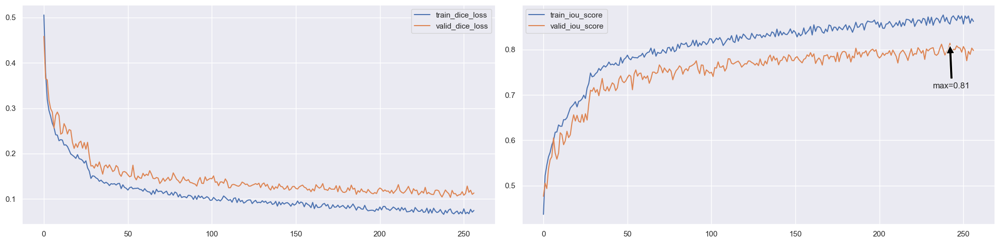

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
# Plot the loss and iou side by side and show max iou via arrow
fig, ax = plt.subplots(1,2, figsize=(20,5))
ax[0].plot(logs["epoch"], logs["train_dice_loss"], label="train_dice_loss")
ax[0].plot(logs["epoch"], logs["valid_dice_loss"], label="valid_dice_loss")

ax[1].plot(logs["epoch"], logs["train_iou_score"], label="train_iou_score")
ax[1].plot(logs["epoch"], logs["valid_iou_score"], label="valid_iou_score")
ax[1].annotate(f"max={logs['valid_iou_score'].max():.2f}", 
                xy=(logs['valid_iou_score'].idxmax(), logs['valid_iou_score'].max()),
                xytext=(logs['valid_iou_score'].idxmax()-10, logs['valid_iou_score'].max()-0.1),
                arrowprops=dict(facecolor='black', shrink=0.05))

ax[0].legend()
ax[1].legend()
fig.tight_layout()
fig.savefig('train_res/2024-09-24/loss_iou.png')
plt.show()


## Loading Trained Model

In [11]:
# !pip install segmentation_models_pytorch --user

In [81]:
import torch
# load trainer as well else won't work
import sys
sys.path.append(r"D:\MSc Works\temp_matching\temp_matching")
from trainer import CustomUnet, EncodingCombination

# Load the model
model = torch.load(
    r"D:\MSc Works\temp_matching\train_res\2024-09-24/best_model.pth"
)
model

CustomUnet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True,

In [14]:
# torch.save(model.state_dict(), 'train_res/2024-09-24/best_model_state_dict.pth')

In [15]:
from model import CustomUnet, EncodingCombination
model_args=dict(
    unet_args={
        "encoder_name": "resnet34",
        # 'encoder_weights': 'imagenet',
        "classes": 1,  # Number of output classes
        "activation": "sigmoid",  # Activation function
        "in_channels": 3,  # Number of input channels
    },
    encoding_combination=EncodingCombination.MULTIPLICATION,
)
nmodel = CustomUnet(**model_args)
state_dict = torch.load("train_res/2024-09-24/best_model_state_dict.pth")
nmodel.load_state_dict(state_dict, strict=True)

<All keys matched successfully>

In [16]:
# nmodel.encoder.conv1.weight==state_dict['encoder.conv1.weight'].to('cpu')

In [17]:
# [k for k in state_dict.keys() if 'layer1.' in k]

## Test on a video

In [82]:
import cv2
import numpy as np

cap = cv2.VideoCapture('assets/pen.mp4')
nframes = 0
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

while cap.isOpened():
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # close the window when 'q' is pressed
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break

        cv2.imshow('frame', frame)
        nframes += 1
    cap.release()
    cv2.destroyAllWindows()

print(f"Total frames: {total_frames}, Frames processed: {nframes}")

Total frames: 0, Frames processed: 0


In [ ]:
# read arbitrary frame by setting the frame number
import matplotlib.pyplot as plt

cap = cv2.VideoCapture("assets/pen.mp4")
cap.set(cv2.CAP_PROP_POS_FRAMES, 1)
ret, frame = cap.read()
# Display the frame
# plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
cv2.imwrite('assets/pen.png', frame)
show_image(frame[125:1050, 1045:1550])

### Evaluator

C:\Users\Viper\AppData\Local\Temp\ipykernel_10252\3957339340.py:12: MatplotlibDeprecationWarning: The tostring_rgb function was deprecated in Matplotlib 3.8 and will be removed in 3.10. Use buffer_rgba instead.
  image = np.frombuffer(fig.canvas.tostring_rgb(), dtype="uint8")


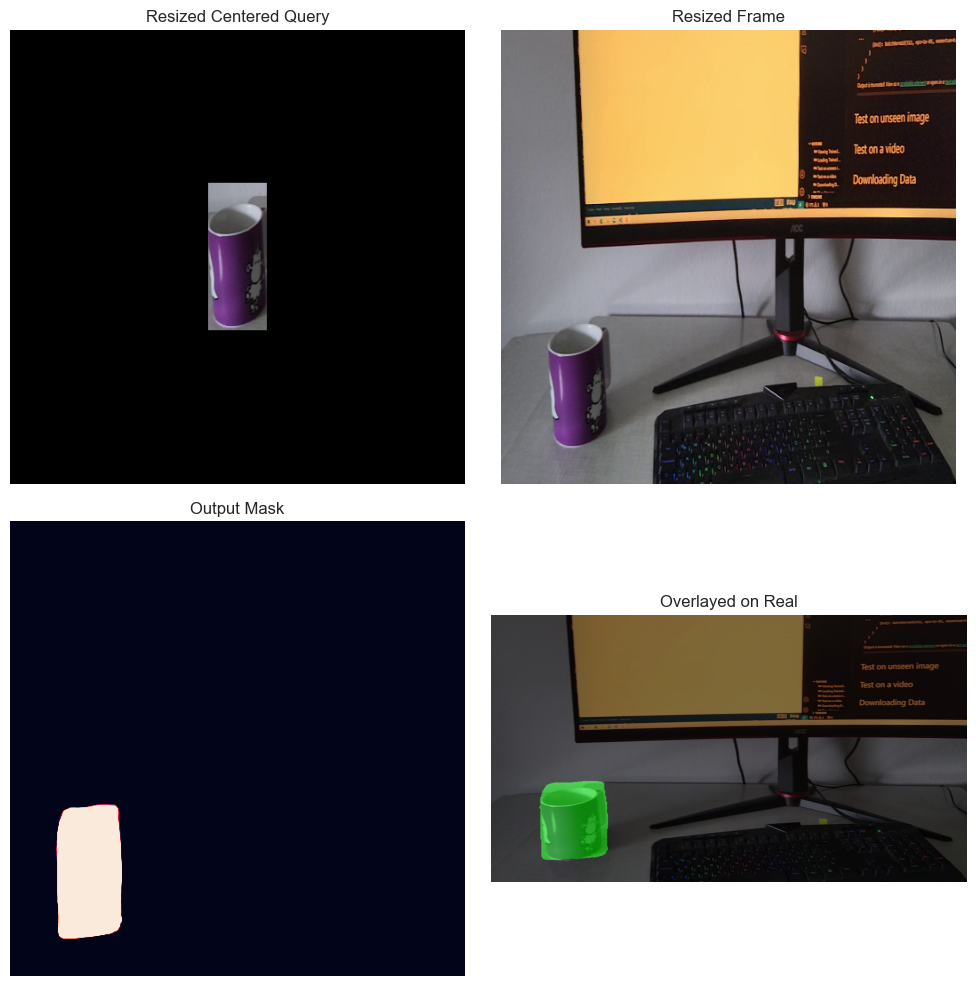

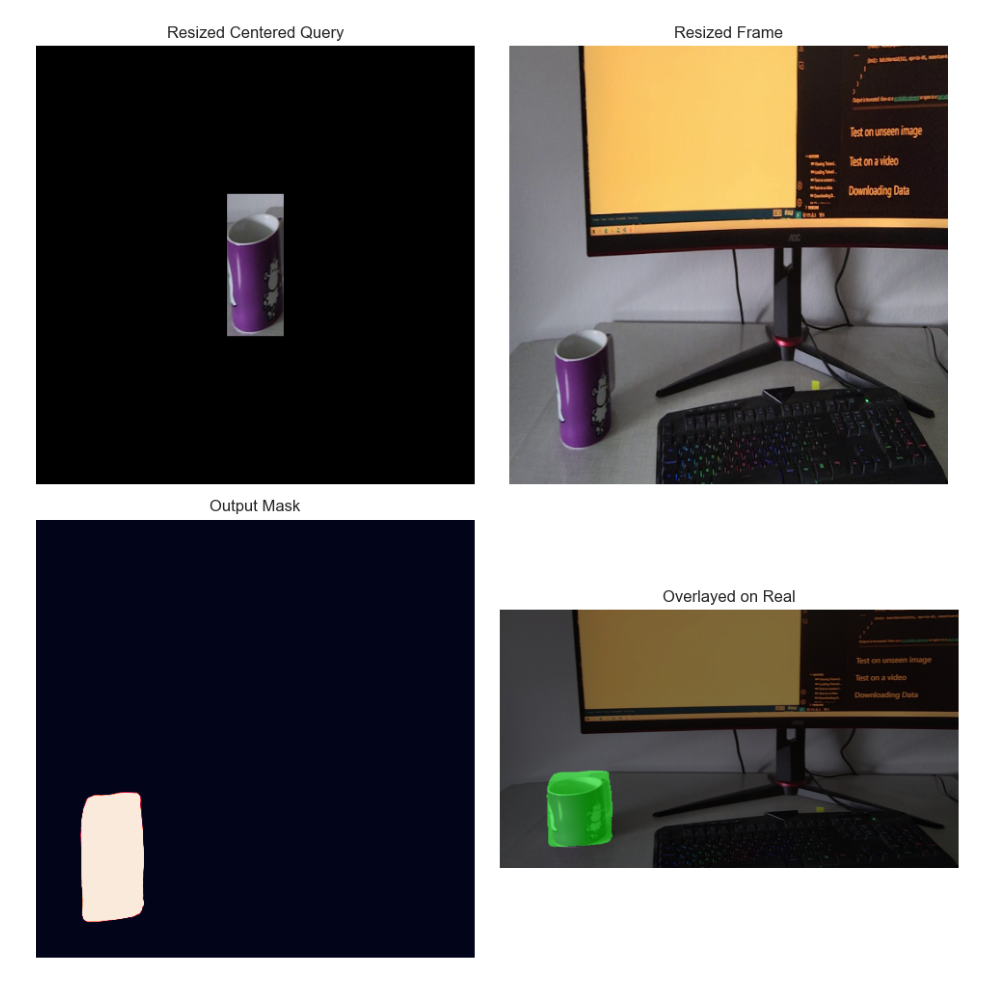

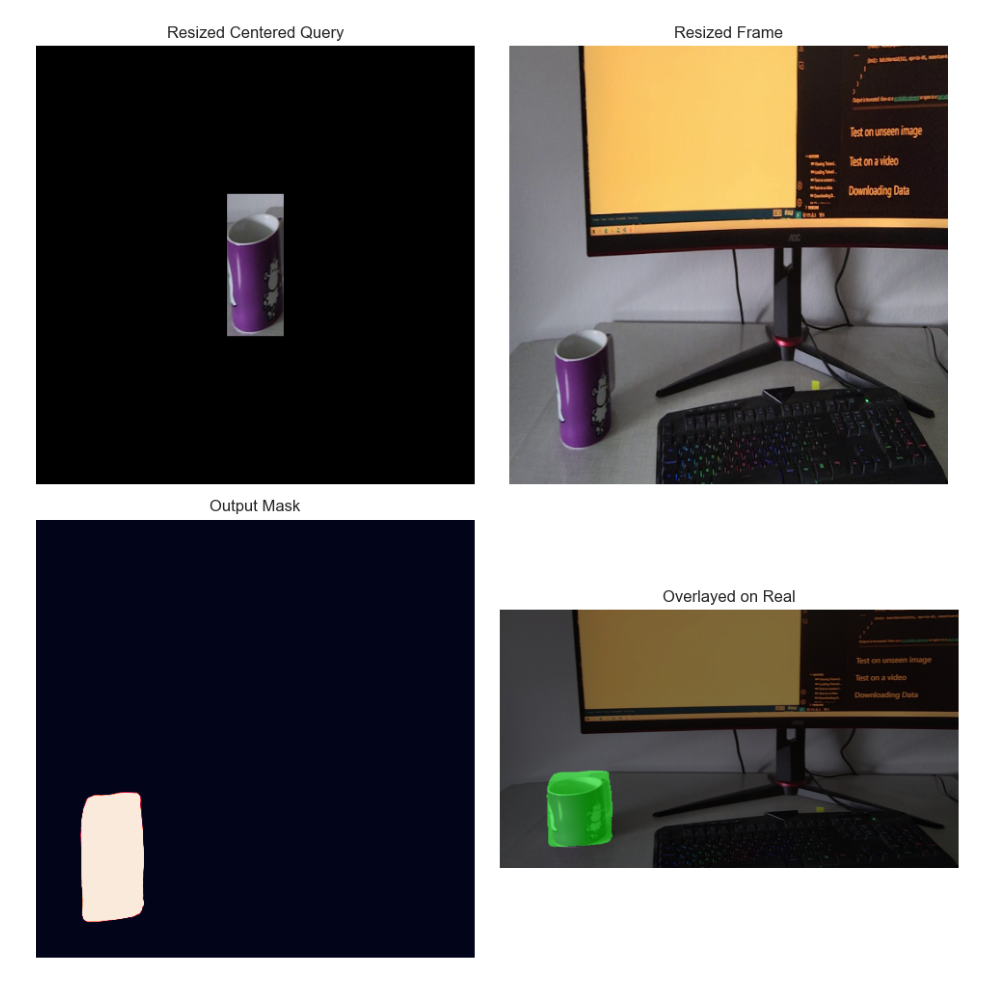

In [61]:
from pathlib import Path

def figure_to_array(fig):
    fig.tight_layout(pad=1)
    # Render the figure to a canvas and get the RGB buffer
    fig.canvas.draw()

    # Get the width and height of the figure in pixels
    width, height = fig.canvas.get_width_height()

    # Convert to a NumPy array
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype="uint8")
    image = image.reshape(height, width, 3)  # Reshape to (height, width, RGB)

    return image


def normalization(x):
    return x / 255

def denormalization(x):
    return x * 255


class Evaluator:

    def __init__(
        self,
        model_path: Path = Path(r"train_res\2024-09-24\best_model.pth"),
        device: str = "cpu",
        input_size: Tuple[int, int] = (512, 512),
    ):
        self.model = torch.load(model_path, map_location=device)
        self.model.eval()
        self.device = device
        self.query = None
        self.input_size = input_size

    def set_query(self, query, frame):
        # Create a black image of the same size as the original
        nquery = np.zeros_like(frame)
        h,w = query.shape[:2]

        # Calculate center positions to place the cropped region
        centered_x = (nquery.shape[1] - w) // 2
        centered_y = (nquery.shape[0] - h) // 2
        nquery[centered_y : centered_y + h, centered_x : centered_x + w] = query
        self.query = cv2.resize(nquery, self.input_size)

    def predict(self, image):
        with torch.no_grad():
            image = cv2.resize(image, self.input_size)
            self.image = image
            image_query = np.concatenate([image, self.query]).reshape(2, *image.shape)
            image_query = normalization(image_query)
            image_query_tensor = torch.from_numpy(image_query).permute(0, 3, 1, 2).to(torch.float32)
            image = image_query_tensor.unsqueeze(0).to(self.device)
            output = self.model(image)
            return output

    def post_process(self, output):
        output = output.cpu().numpy()
        output = output.squeeze()>0.5
        return output.astype(np.uint8)
    
    def overlay_mask(self, image, mask, color=[0, 255, 0]):
        # Resize the mask to match the image size
        mask = cv2.resize(mask, (image.shape[1], image.shape[0]))

        # Normalize the mask to be in range [0, 1] if it's not binary
        mask = (mask > 0).astype(np.uint8)

        # Convert the mask to a 3-channel mask
        mask = np.stack([mask]*3, axis=-1)

        # Create a colored version of the mask
        colored_mask = mask * np.array(color, dtype=np.uint8)

        # Overlay the mask on the image using addWeighted
        overlayed = cv2.addWeighted(image, 0.5, colored_mask, 0.5, 0)

        return overlayed

evaluator = Evaluator()
# evaluator.model = nmodel

frame = cv2.imread('assets/frame_100.png')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
query = frame[650:1000, 200:450]

# show_image(query)
# plt.show()

evaluator.set_query(query, frame)

# show_image(evaluator.query)

output = evaluator.predict(frame).squeeze(0,1)
overlayed = evaluator.overlay_mask(frame, evaluator.post_process(output))
fig = subplot_images(
    [evaluator.query, evaluator.image, output * 255, overlayed],
    order=(2, -1),
    titles=["Resized Centered Query", "Resized Frame", "Output Mask", "Overlayed on Real"],
    show=False,
)
fig_img = figure_to_array(fig)
cv2.imwrite('assets/query_overlay.png', cv2.cvtColor(fig_img, cv2.COLOR_RGB2BGR))
show_image(fig_img)

### Run Evaluation

In [92]:
import matplotlib

matplotlib.use("Agg")  # Use the non-interactive Agg backend
frame = cv2.imread('assets/frame_100.png')
query = frame[650:1000, 200:450]
evaluator = Evaluator()
evaluator.set_query(query, frame)

while True:
    ret, frame = cap.read()
    if not ret:
        break

    
    output = evaluator.predict(frame).squeeze(0,1)
    overlayed = evaluator.overlay_mask(frame, evaluator.post_process(output))
    fig = subplot_images(
        [evaluator.query, evaluator.image, output * 255, overlayed],
        order=(2, -1),
        titles=["Resized Centered Query", "Resized Frame", "Output Mask", "Overlayed on Real"],
        show=False,
    )
    fig_img = figure_to_array(fig)
    cv2.imshow('frame', cv2.cvtColor(fig_img, cv2.COLOR_RGB2BGR))
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

C:\Users\Viper\AppData\Local\Temp\ipykernel_10920\1060065769.py:12: MatplotlibDeprecationWarning: The tostring_rgb function was deprecated in Matplotlib 3.8 and will be removed in 3.10. Use buffer_rgba instead.
  image = np.frombuffer(fig.canvas.tostring_rgb(), dtype="uint8")


## Downloading Data

In [5]:
# Step 1: Set up the environment
import os
import torch
from torchvision.datasets import CocoDetection
from torchvision import transforms
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import requests
from tqdm.notebook import tqdm


# # Step 2: Create directories if not already present
# !mkdir -p ./coco

# # Download COCO 2017 Train images if not already downloaded
# # if not os.path.exists('./coco/train2017.zip'):
# #     !wget -q --show-progress http://images.cocodataset.org/zips/train2017.zip -P ./coco

# # Download COCO 2017 Validation images if not already downloaded
# if not os.path.exists('./coco/val2017.zip'):
#     !wget -q --show-progress http://images.cocodataset.org/zips/val2017.zip -P ./coco

# # Download COCO 2017 Annotations if not already downloaded
# if not os.path.exists('./coco/annotations_trainval2017.zip'):
#     !wget -q --show-progress http://images.cocodataset.org/annotations/annotations_trainval2017.zip -P ./coco

# # Step 3: Extract the downloaded files
# !unzip -q ./coco/train2017.zip -d ./coco  # Extract training images
# !unzip -q ./coco/val2017.zip -d ./coco    # Extract validation images
# !unzip -q ./coco/annotations_trainval2017.zip -d ./coco  # Extract annotations

# # Step 4: Define paths for images and annotations
# coco_train = './coco/train2017'  # Path to extracted training images
# coco_val = './coco/val2017'      # Path to extracted validation images
# coco_ann_train = './coco/annotations/instances_train2017.json'  # Path to train annotations
# coco_ann_val = './coco/annotations/instances_val2017.json'      # Path to validation annotations



In [15]:
%%capture
%pip --proxy http://proxy:80 install segmentation_models_pytorch==0.3.3
%pip --proxy http://proxy:80 install scikit-learn


## COCO Dataset


In [ ]:
import json
import os
import cv2
import numpy as np
from torch.utils.data import Dataset
from typing import Any, Dict, Tuple, Union, Optional
from pydantic import BaseModel
from enum import Enum
from sklearn.model_selection import train_test_split
import albumentations as A

class DataConfig(BaseModel):
    data_root: str
    annotation_path: str
    #w,h
    image_size: Tuple[int, int] = (224, 224)
    min_query_hw: int = 32
    #augmentation
    aug_rate:float=0.5
    rotate_anlge:Tuple[int, int]=-10,10
    flip_rate:float=0.5
    #after rotation, original region will be black, fill it by what was there before?
    fill_blank_by_original:bool=True

    random_seed :int= 100
    max_data:int=-1
    train_size:float=0.9
    wrong_query_rate:float=0.5

class DataType(Enum):
  TRAIN='train'
  VALID='valid'

def normalization(x):
  return x/255

def denormalization(x):
  return x*255


class CustomCocoDataset(Dataset):
    def __init__(self, config: DataConfig,
                 normalization:callable=normalization,
                 denormalization:callable=denormalization,
                 data_type:DataType=DataType.TRAIN,
                 image_augmentation:Optional[A.Compose]=A.Compose([A.Blur(), A.ColorJitter(),
                                                         A.GaussNoise(),
                A.Emboss(),
                A.MultiplicativeNoise(multiplier=(0.97, 1.03))], p=0.5)
                 ):
        """
        Custom Dataset to load images and their respective bounding boxes.

        Args:
            config (DataConfig): Configuration object containing dataset paths and parameters.
        """
        self.config=config
        self.data_root = config.data_root
        self.image_size = config.image_size
        self.min_query_hw = config.min_query_hw
        self.data_type=data_type
        self.random_state = np.random.RandomState(config.random_seed)
        self.normalization=normalization
        self.denormalization=denormalization
        self.image_augmentation=image_augmentation
        # Load the annotation file and create the bounding box dictionary
        self.bbox_dict = self._load_annotations(config.annotation_path)
        bbox_keys = list(self.bbox_dict.keys())
        if self.config.train_size<1:
          train_keys, valid_keys = train_test_split(bbox_keys, train_size=self.config.train_size, random_state=self.random_state)
          if self.data_type==DataType.TRAIN:
            self.keys = train_keys
          else:
            self.keys=valid_keys
        else:
          self.keys = bbox_keys
        print(f"Data for {data_type}: {len(self)}")

    def _load_annotations(self, annotation_path: str) -> Dict[int, Tuple[Any, str]]:
        """
        Reads the annotation file and extracts bounding boxes with image paths,
        filtering out boxes smaller than min_query_hw.

        Args:
            annotation_path (str): Path to the annotation JSON file.

        Returns:
            bbox_dict (Dict[int, Tuple[Any, str]]): A dictionary mapping index to bounding box and image path.
        """
        with open(annotation_path, 'r') as f:
            annotations = json.load(f)

        bbox_dict = {}
        total_annotations = len(annotations['annotations'])
        print(f"Total annotations: {total_annotations}")
        selected_annotations = 0

        # Assuming COCO-style annotation structure
        for ann in annotations['annotations']:

            bbox = ann['bbox']  # Get the bounding box coordinates [x, y, width, height]
            x, y, w, h = map(int, bbox)

            # Check if bounding box meets the minimum size requirement
            if w >= self.min_query_hw and h >= self.min_query_hw:
                image_id = ann['image_id']

                # Find the corresponding image file name
                image_info = next((img for img in annotations['images'] if img['id'] == image_id), None)

                if image_info:
                    image_path = os.path.join(self.data_root, image_info['file_name'])
                    # bbox_dict[idx] = (bbox, image_path)
                    if image_path not in bbox_dict:
                      bbox_dict[image_path] = []
                    bbox_dict[image_path].append(bbox)
                    selected_annotations+=1
            if self.config.max_data>0 and len(bbox_dict)>self.config.max_data:
              break
        print(f"Total selected images: {len(bbox_dict)}, Num. Annotations: {selected_annotations}")
        return bbox_dict

    def __len__(self):
        """Returns the total number of bounding boxes."""
        return len(self.keys)
    def get_query_label(self, idx):
        image_path=self.keys[idx]
        bboxes = self.bbox_dict[image_path]

        # Read the image using OpenCV
        image = cv2.imread(image_path)


        if image is None:
            raise FileNotFoundError(f"Image not found: {image_path}")

        if len(bboxes)==0:
          return image, np.zeros_like(image), np.zeros(image.shape[:2], dtype=np.uint8)
        # Randomly select a bounding box
        bbox = bboxes[self.random_state.randint(0, len(bboxes))]
        x, y, w, h = map(int, bbox)

        # Create a mask of the same size as the original image, initialized to zeros
        mask = np.zeros(image.shape[:2], dtype=np.uint8)

        # Mark the area of the bounding box in the mask
        mask[y:y+h, x:x+w] = 255

        # Crop the region of the bounding box from the original image
        cropped_region = image[y:y+h, x:x+w]

        # Create a black image of the same size as the original
        query = np.zeros_like(image)

        # Calculate center positions to place the cropped region
        centered_x = (query.shape[1] - w) // 2
        centered_y = (query.shape[0] - h) // 2

        # Place the cropped region in the center of the black image
        query[centered_y:centered_y+h, centered_x:centered_x+w] = cropped_region

        # Convert the images to RGB format
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        query = cv2.cvtColor(query, cv2.COLOR_BGR2RGB)

        # Resize the images to the specified size
        image = cv2.resize(image, self.image_size)
        oimage = image.copy()
        query = cv2.resize(query, self.image_size)
        mask = cv2.resize(mask, self.image_size)

        # apply augmentation
        if self.random_state.uniform() < self.config.aug_rate:
          angle = self.random_state.uniform(self.config.rotate_anlge[0],
                                            self.config.rotate_anlge[1])
          rotation_matrix = cv2.getRotationMatrix2D((query.shape[1]//2, query.shape[0]//2),
                                                    angle, 1)
          # query = cv2.warpAffine(query, rotation_matrix, (query.shape[1], query.shape[0]))
          image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))
          mask = cv2.warpAffine(mask, rotation_matrix, (mask.shape[1], mask.shape[0]))
          # print(f"Angle: {angle}")

          if self.random_state.uniform() < self.config.flip_rate:
            query = cv2.flip(query, 1)
            image = cv2.flip(image, 1)
            mask = cv2.flip(mask, 1)
          if self.config.fill_blank_by_original:
            immask = (image==[0,0,0]).sum(axis=2)==3
            image[immask] = oimage[immask]

        return image, query, mask

    def __getitem__(self, index: int) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """
        Fetches the original image, the query (centered cropped region), and the mask.

        Args:
            index (int): The index of the bounding box.

        Returns:
            Tuple[np.ndarray, np.ndarray, np.ndarray]: Original image, query (centered cropped region), and mask.
        """
        image, query, mask = self.get_query_label(index)

        if self.random_state.uniform() < self.config.wrong_query_rate:
          # find an index thats not equal to current one
          while True:
            nidx = self.random_state.randint(len(self))
            if nidx!=index:
              img2, query, mask2 = self.get_query_label(nidx)
              break

          mask = np.zeros_like(mask)

        if self.image_augmentation:
          augmented = self.image_augmentation(image=image)
          image = augmented['image']

        image_query = np.concatenate((image, query)).reshape(2, *image.shape)

        image = self.normalization(image)
        query = self.normalization(query)
        mask = mask/255
        image_query = self.normalization(image_query)

        image_query_tensor = torch.from_numpy(image_query).permute(0, 3, 1, 2).to(torch.float32)
        mask_tensor = torch.from_numpy(mask).unsqueeze(0).to(torch.float32)

        return image_query_tensor, mask_tensor



### Wrong Query Checking

Total annotations: 860001
Total selected images: 11, Num. Annotations: 12
Data for DataType.TRAIN: 11


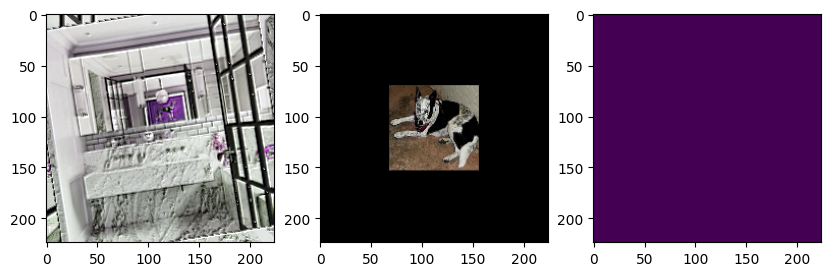

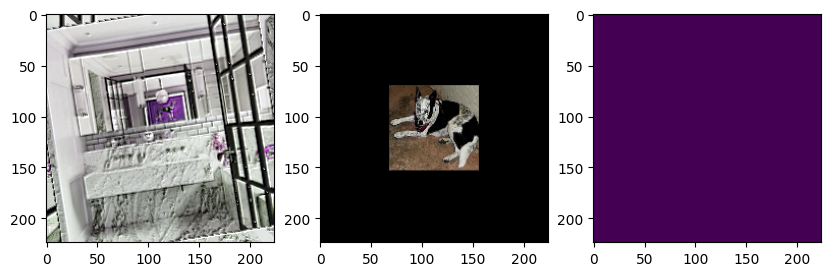

In [20]:
# Example usage:
config = DataConfig(
    data_root='/tmp/train2017',
    annotation_path='/tmp/annotations/instances_train2017.json',
    image_size=(224, 224),
    min_query_hw=32,
    aug_rate=1,
    rotate_anlge=(-20,20),
    flip_rate=0.5,
    random_seed = 100,
    max_data=10,
    wrong_query_rate=1,
    train_size=1,
)


dataset = CustomCocoDataset(config=config)


imq, mt = dataset[5]
im = imq[0].permute(1,2,0).numpy()
query = imq[1].permute(1,2,0).numpy()
mask = mt.squeeze(0,1).numpy()
image = dataset.denormalization(im).astype(np.uint8)
query = dataset.denormalization(query).astype(np.uint8)
mask = (mask*255).astype(np.uint8)
subplot_images([image, query, mask], order=(1, 3), axis=True)

### Fine Query Checking

Total annotations: 36781
Total selected images: 11, Num. Annotations: 11
Data for DataType.TRAIN: 9


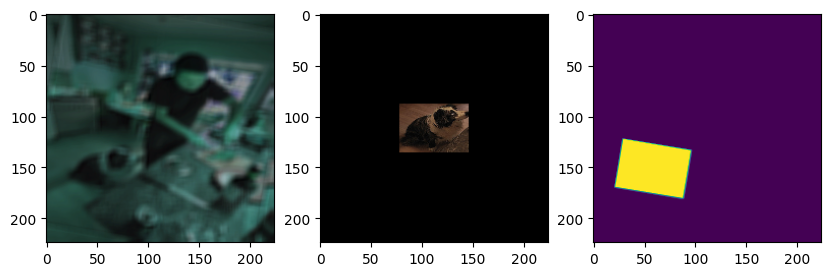

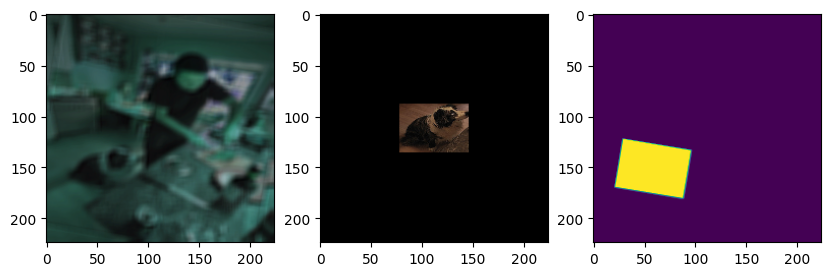

In [7]:
# Example usage:
config = DataConfig(
    data_root='/content/coco/val2017',
    annotation_path='/content/coco/annotations/instances_val2017.json',
    image_size=(224, 224),
    min_query_hw=32,
    aug_rate=1,
    rotate_anlge=(-100,100),
    flip_rate=0.5,
    random_seed = 100,
    max_data=10,
    wrong_query_rate=0
)


dataset = CustomCocoDataset(config=config)


imq, mt = dataset[5]
im = imq[0].permute(1,2,0).numpy()
query = imq[1].permute(1,2,0).numpy()
mask = mt.squeeze(0,1).numpy()
image = dataset.denormalization(im).astype(np.uint8)
query = dataset.denormalization(query).astype(np.uint8)
mask = (mask*255).astype(np.uint8)
subplot_images([image, query, mask], order=(1, 3), axis=True)

In [8]:
from segmentation_models_pytorch import Unet

from copy import deepcopy
from enum import Enum
import torch.nn as nn

class EncodingCombination(Enum):
  ADDITION = 'addition'
  CONCATENATION = 'concatenation'
  MULTIPLICATION = 'multiplication'


class CustomUnet(Unet):
  def __init__(self, unet_args:dict, encoding_combination:EncodingCombination=EncodingCombination.MULTIPLICATION):
    super().__init__(**unet_args)
    self.image_encoder = self.encoder
    self.query_encoder = deepcopy(self.encoder)
    self.encoding_combination = encoding_combination
    if self.encoding_combination == EncodingCombination.CONCATENATION:
            device = next(self.encoder.parameters()).device
            features = self.encoder(torch.rand(1, 3, 256, 256).to(device))
            combine_layers = []
            for feature in features:
                in_channel = feature.shape[1]
                # nh = (h+2p-f)/s+1
                # p=(s(nh-1)-h+f)/2
                # set s=1, p=(f-1)/2
                kernel_size = 3
                padding = (kernel_size - 1) // 2
                combine_layers.append(
                    nn.Conv2d(
                        in_channel * 2,
                        in_channel,
                        (kernel_size, kernel_size),
                        padding=padding,
                    ).to(device)
                )

            self.feature_combiner = combine_layers
            del combine_layers
            del feature

  def forward(self, x:torch.Tensor)->torch.Tensor:
    image, query = x[:,0], x[:,1]
    self.check_input_shape(image)
    self.check_input_shape(query)
    image_features = self.image_encoder(image)
    query_features = self.query_encoder(query)


    combined_features = []
    for i, (imf, qrf) in enumerate(zip(image_features, query_features)):
      if self.encoding_combination == EncodingCombination.ADDITION:
        combined_features.append(imf + qrf)
      elif self.encoding_combination == EncodingCombination.MULTIPLICATION:
        combined_features.append(imf*qrf)
      elif self.encoding_combination == EncodingCombination.CONCATENATION:
        combined = torch.cat([imf, qrf], dim=1)
        fc=self.feature_combiner[i]
        if next(fc.parameters()).device != combined.device:
            self.feature_combiner[i] = fc.to(combined.device)
        combined_features.append(self.feature_combiner[i](combined))

      else:
        raise ValueError(f"Unknown encoding combination: {self.encoding_combination}")

    decoder_output = self.decoder(*combined_features)
    masks = self.segmentation_head(decoder_output)

    return masks


model = CustomUnet(unet_args = {
        'encoder_name': 'resnet18',
        'encoder_weights': 'imagenet',
        'classes': 1,  # Number of output classes
        'activation': 'sigmoid',  # Activation function
        'in_channels': 3  # Number of input channels
    },
                   encoding_combination=EncodingCombination.CONCATENATION)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 65.2MB/s]


Total annotations: 36781
Total selected images: 4859, Num. Annotations: 21627
Data for DataType.TRAIN: 4373
Total annotations: 36781
Total selected images: 4859, Num. Annotations: 21627
Data for DataType.TRAIN: 4373

Epoch: 0
valid: 100%|██████████| 1094/1094 [01:23<00:00, 13.10it/s, dice_loss - 0.6104, iou_score - 0.2589]
Model saved!


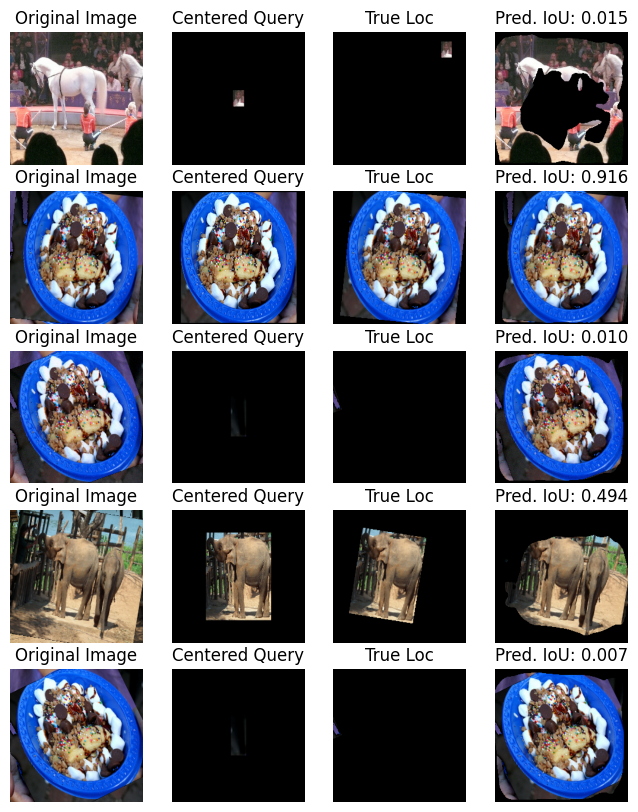


Epoch: 1
valid: 100%|██████████| 1094/1094 [01:28<00:00, 12.39it/s, dice_loss - 0.4374, iou_score - 0.4163]
Model saved!


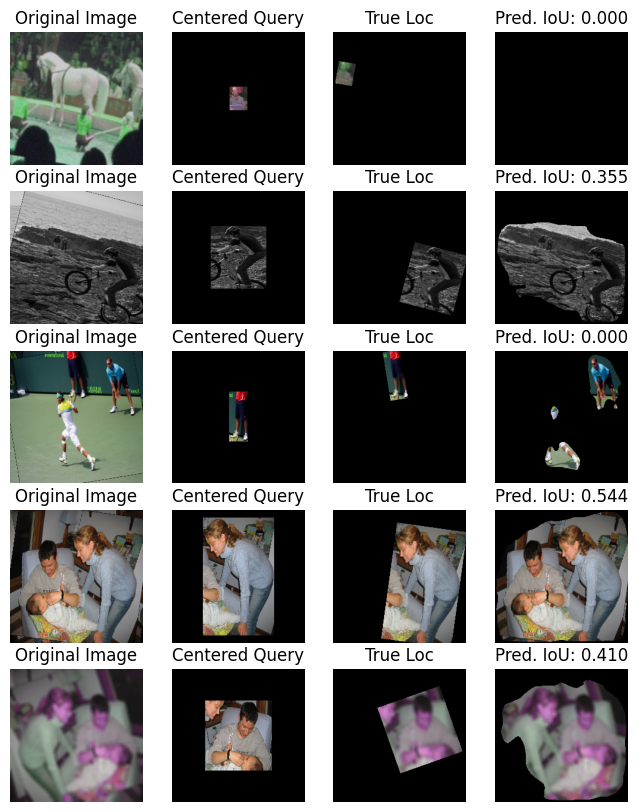


Epoch: 2
valid: 100%|██████████| 1094/1094 [01:30<00:00, 12.07it/s, dice_loss - 0.3731, iou_score - 0.4851]
Model saved!


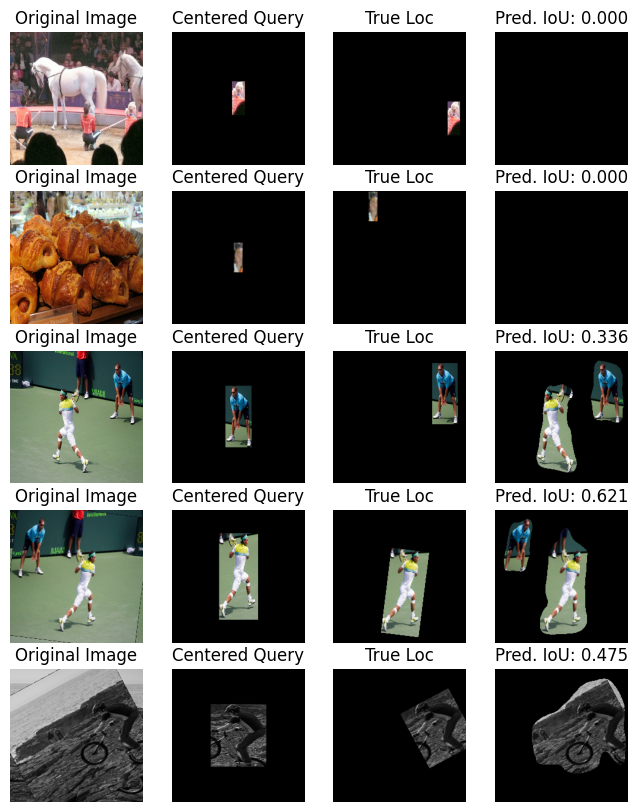


Epoch: 3
valid: 100%|██████████| 1094/1094 [01:36<00:00, 11.28it/s, dice_loss - 0.4637, iou_score - 0.3984]


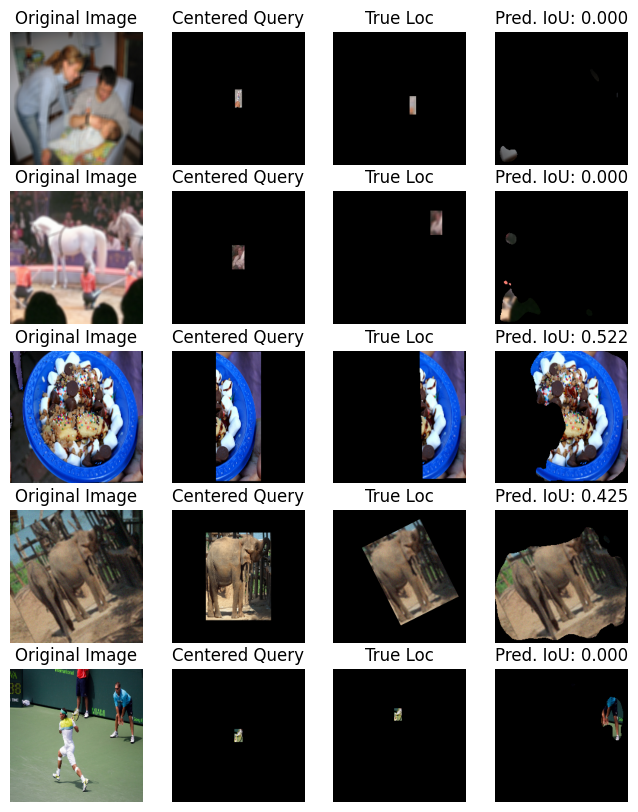


Epoch: 4
valid: 100%|██████████| 1094/1094 [01:36<00:00, 11.29it/s, dice_loss - 0.6491, iou_score - 0.2279]


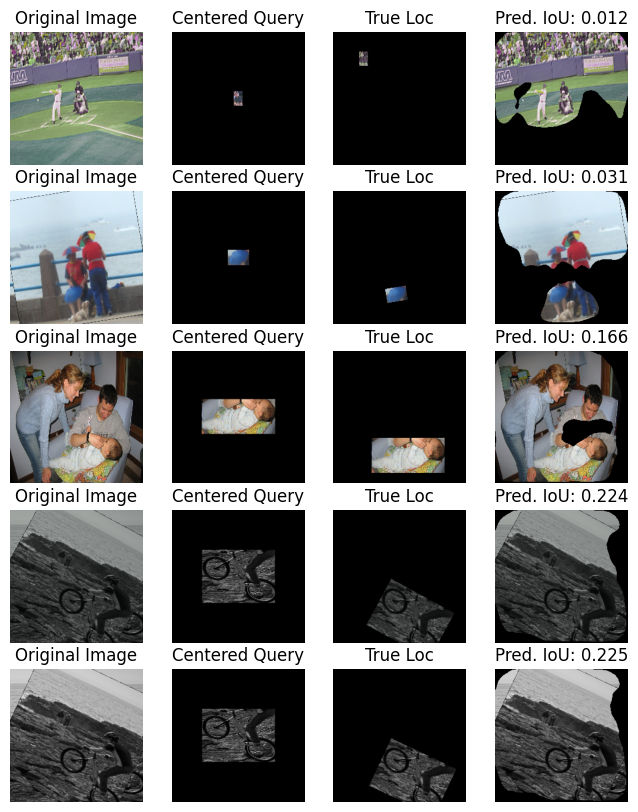


Epoch: 5
valid: 100%|██████████| 1094/1094 [01:41<00:00, 10.82it/s, dice_loss - 0.6703, iou_score - 0.2111]


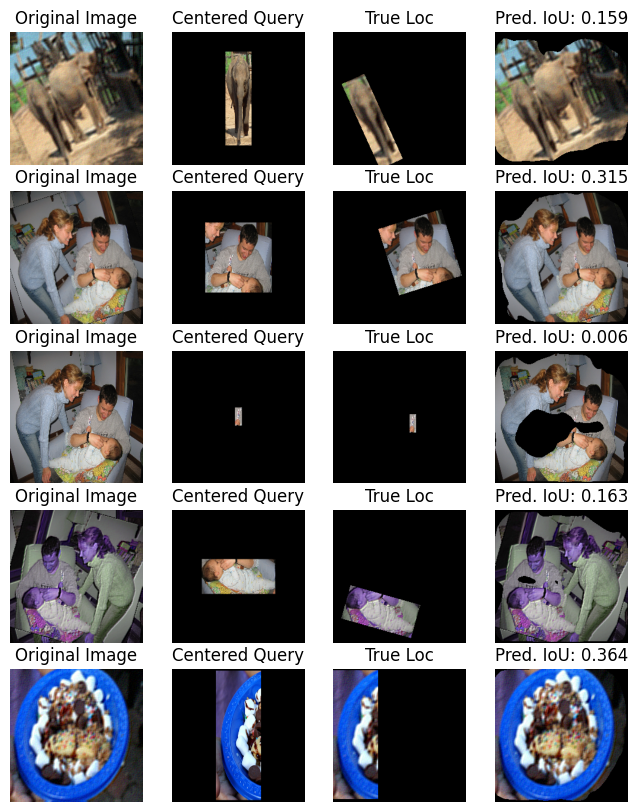


Epoch: 6
valid: 100%|██████████| 1094/1094 [01:45<00:00, 10.32it/s, dice_loss - 0.5666, iou_score - 0.296]


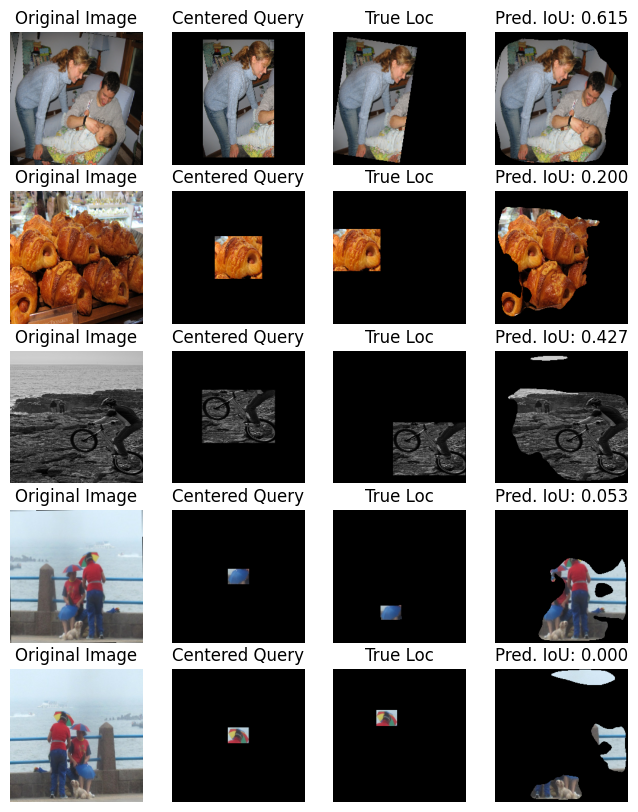


Epoch: 7
valid: 100%|██████████| 1094/1094 [01:43<00:00, 10.54it/s, dice_loss - 0.3945, iou_score - 0.4648]


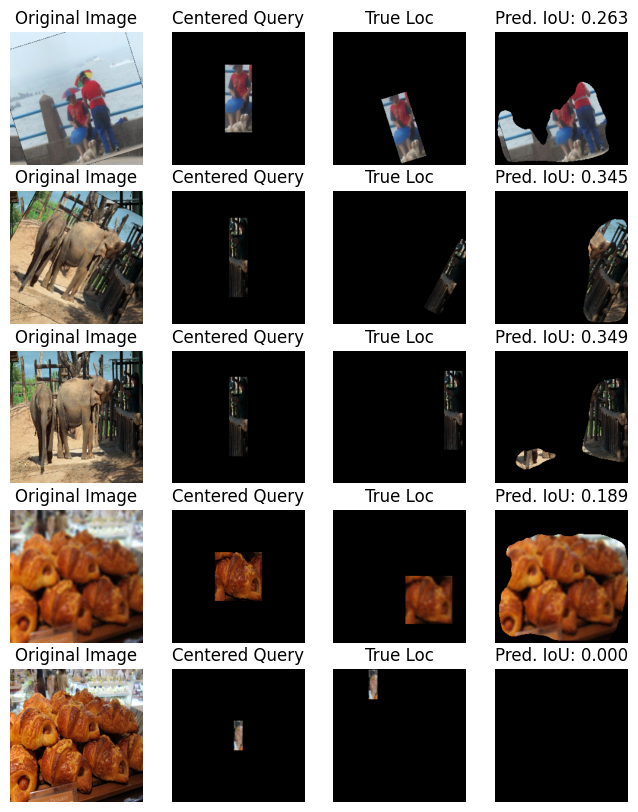


Epoch: 8
valid: 100%|██████████| 1094/1094 [01:49<00:00,  9.96it/s, dice_loss - 0.4461, iou_score - 0.4124]


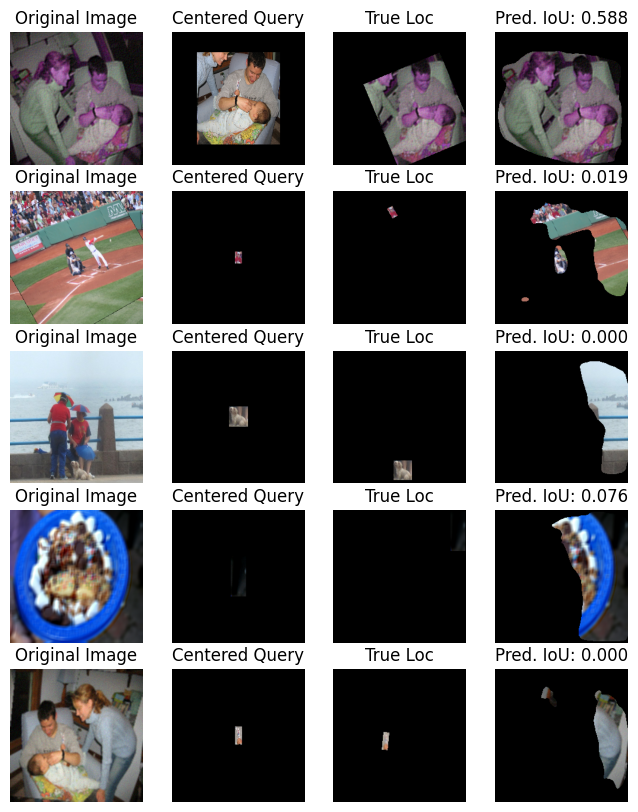


Epoch: 9
valid: 100%|██████████| 1094/1094 [01:48<00:00, 10.05it/s, dice_loss - 0.6185, iou_score - 0.2538]


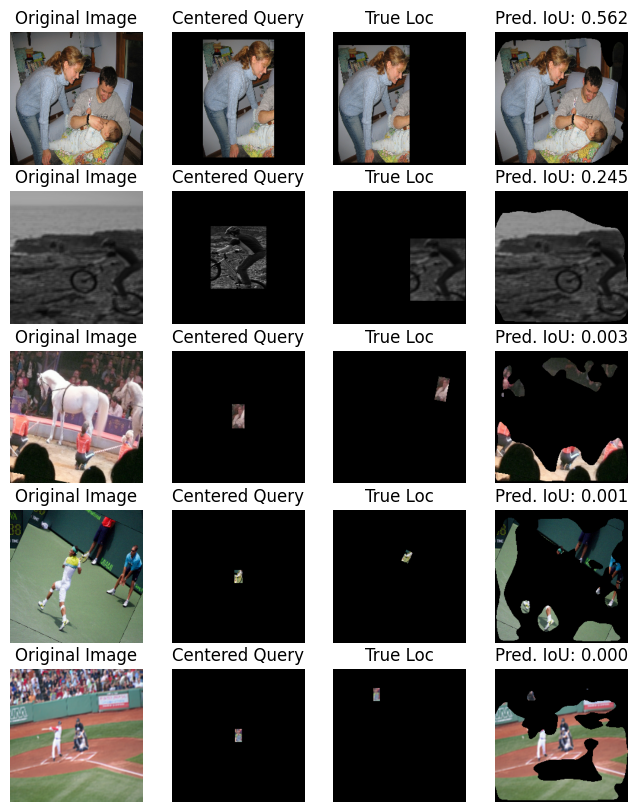


Epoch: 10
valid: 100%|██████████| 1094/1094 [01:50<00:00,  9.88it/s, dice_loss - 0.5323, iou_score - 0.3292]


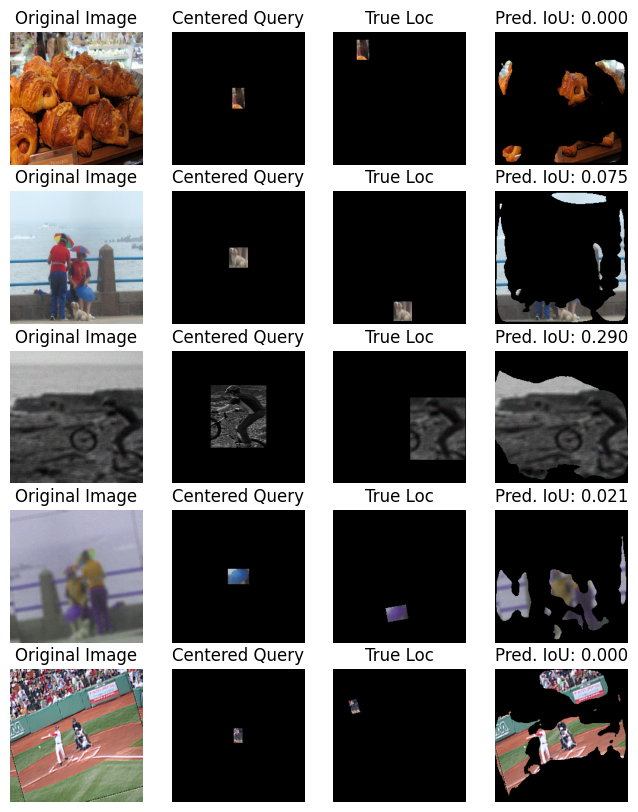


Epoch: 11
valid: 100%|██████████| 1094/1094 [01:48<00:00, 10.09it/s, dice_loss - 0.464, iou_score - 0.3929]


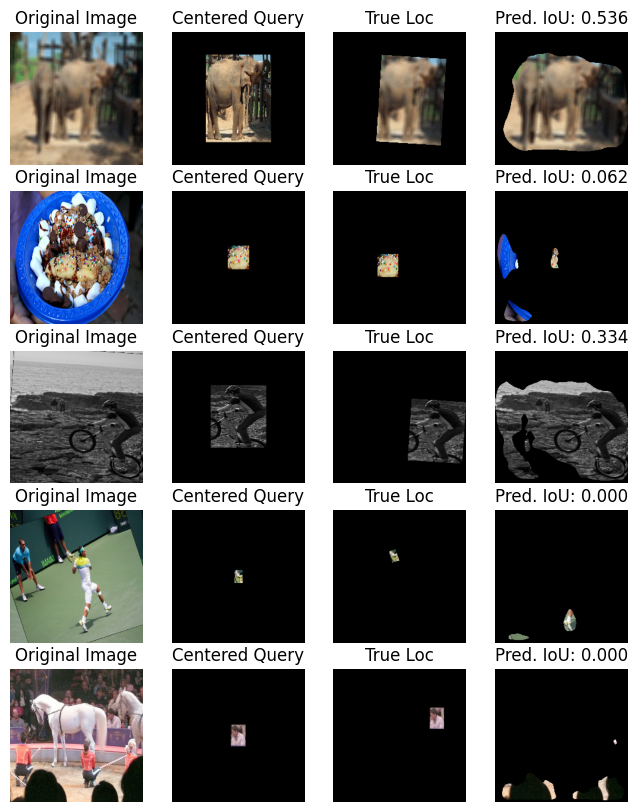


Epoch: 12
valid: 100%|██████████| 1094/1094 [01:48<00:00, 10.07it/s, dice_loss - 0.3438, iou_score - 0.531]
Model saved!


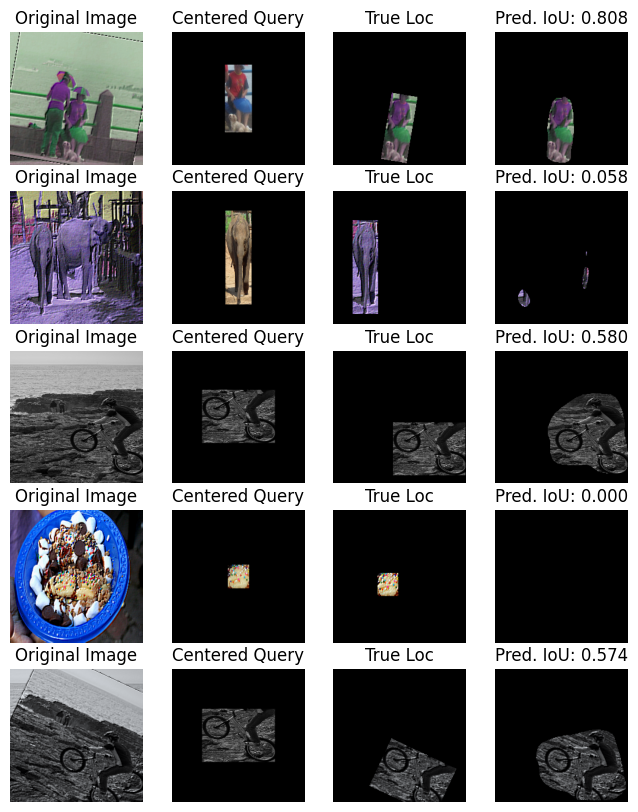


Epoch: 13
valid: 100%|██████████| 1094/1094 [01:47<00:00, 10.18it/s, dice_loss - 0.4723, iou_score - 0.3948]


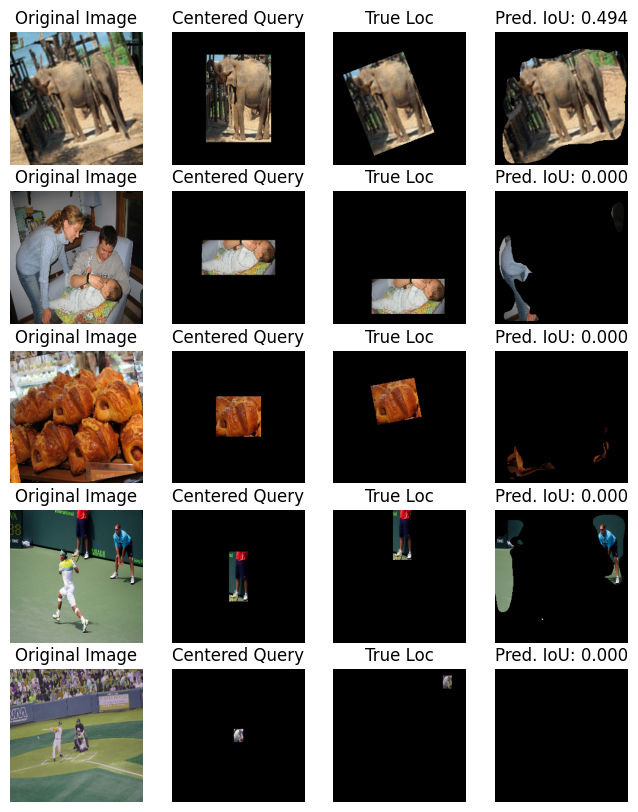


Epoch: 14
valid: 100%|██████████| 1094/1094 [01:50<00:00,  9.94it/s, dice_loss - 0.5081, iou_score - 0.3513]


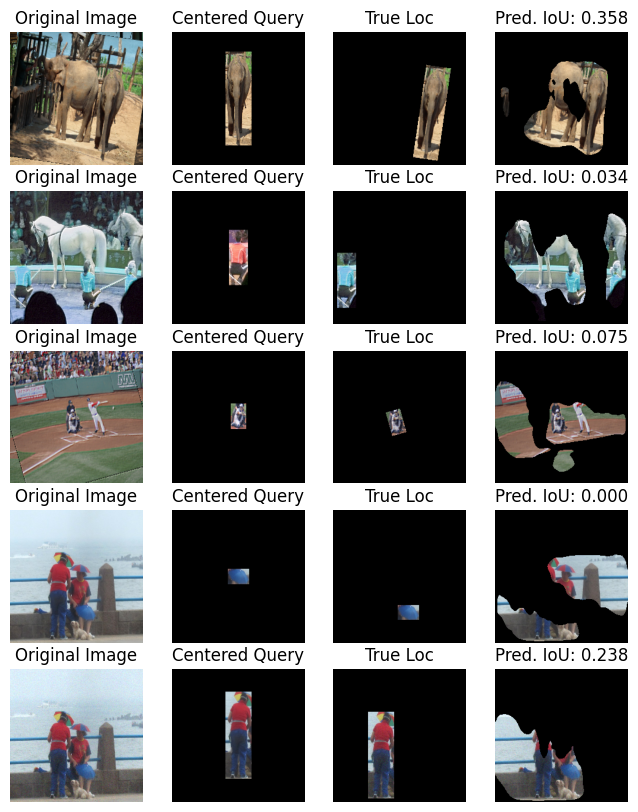


Epoch: 15
valid: 100%|██████████| 1094/1094 [01:48<00:00, 10.05it/s, dice_loss - 0.4688, iou_score - 0.3885]


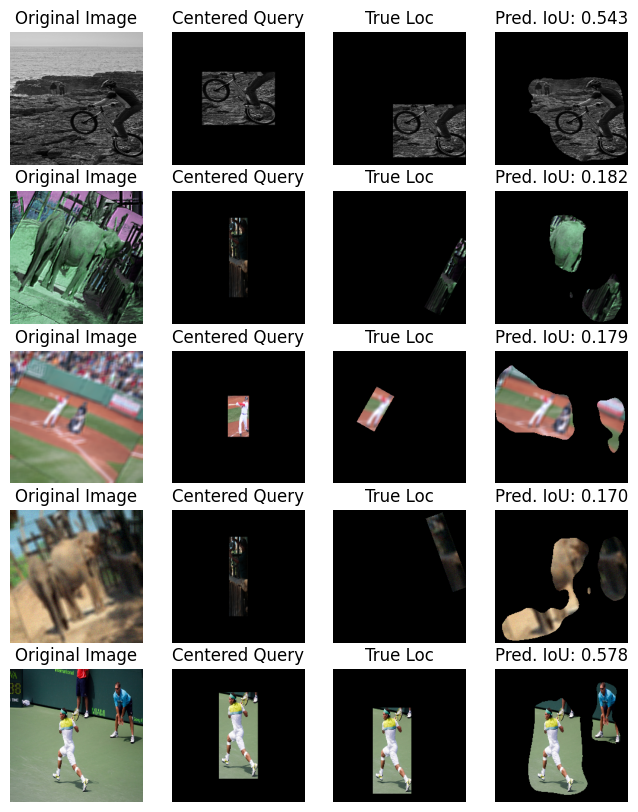


Epoch: 16
valid: 100%|██████████| 1094/1094 [01:52<00:00,  9.71it/s, dice_loss - 0.3668, iou_score - 0.4955]


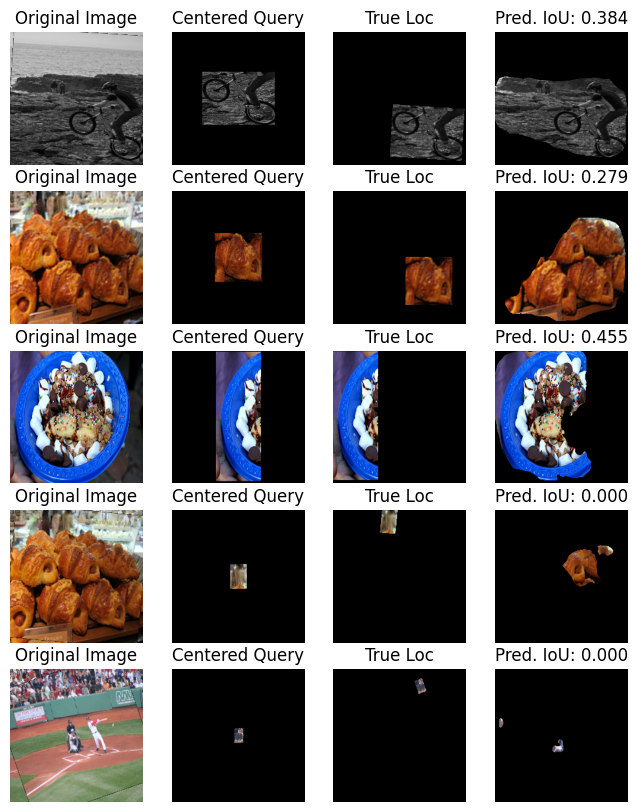


Epoch: 17
valid: 100%|██████████| 1094/1094 [01:51<00:00,  9.85it/s, dice_loss - 0.48, iou_score - 0.3815]


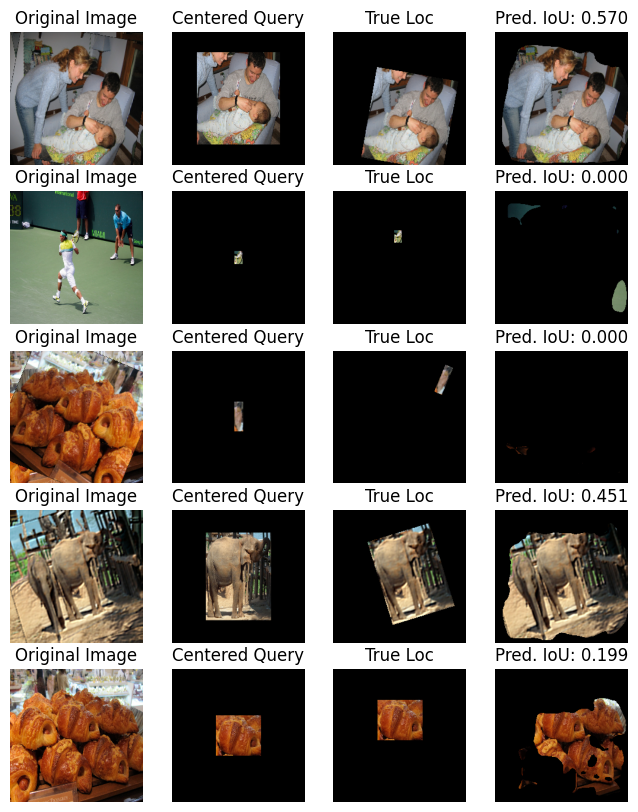


Epoch: 18
valid: 100%|██████████| 1094/1094 [01:49<00:00, 10.02it/s, dice_loss - 0.4967, iou_score - 0.3641]


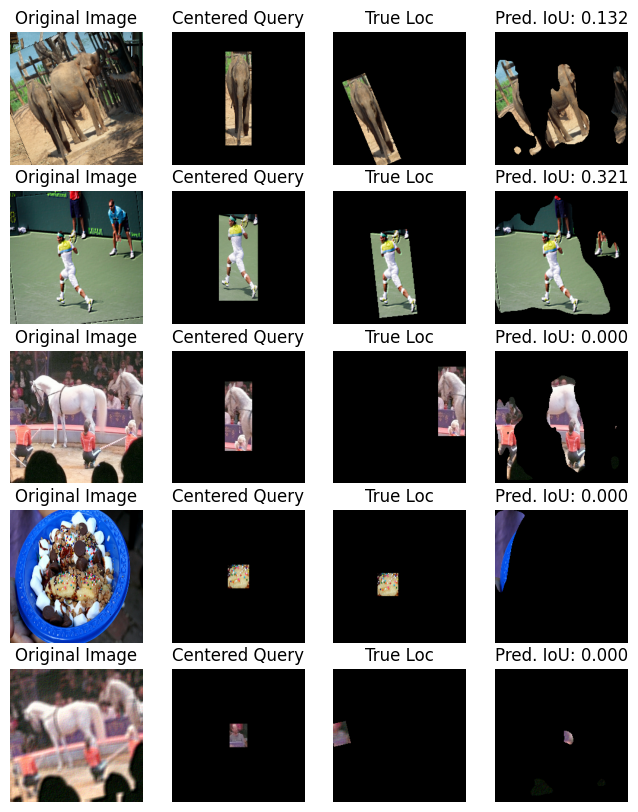


Epoch: 19
valid: 100%|██████████| 1094/1094 [01:51<00:00,  9.81it/s, dice_loss - 0.3847, iou_score - 0.4764]


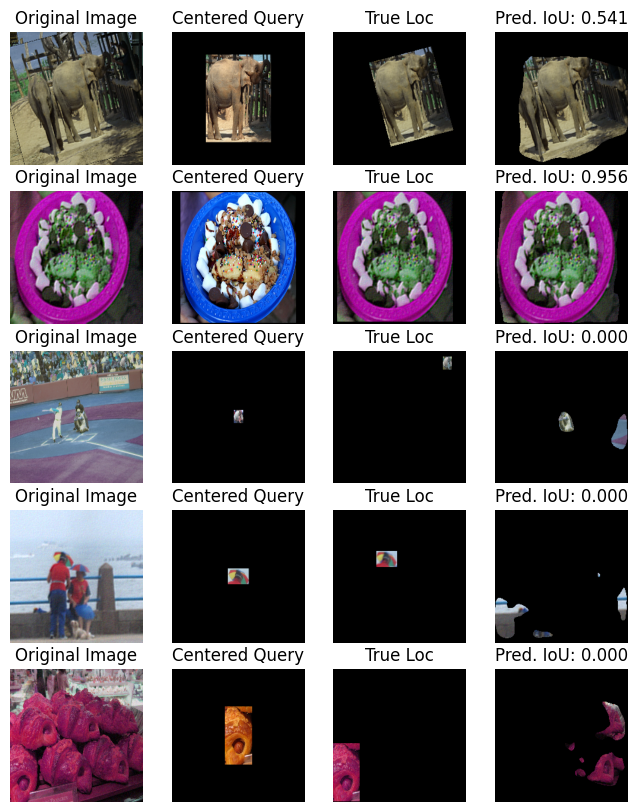


Epoch: 20
valid: 100%|██████████| 1094/1094 [01:51<00:00,  9.78it/s, dice_loss - 0.3093, iou_score - 0.5653]
Model saved!


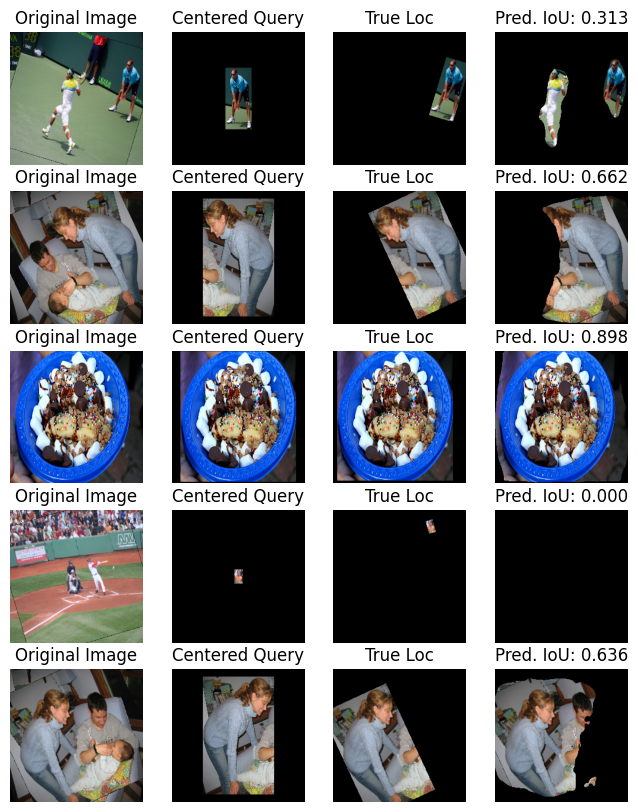


Epoch: 21
valid: 100%|██████████| 1094/1094 [01:49<00:00,  9.98it/s, dice_loss - 0.4604, iou_score - 0.4049]


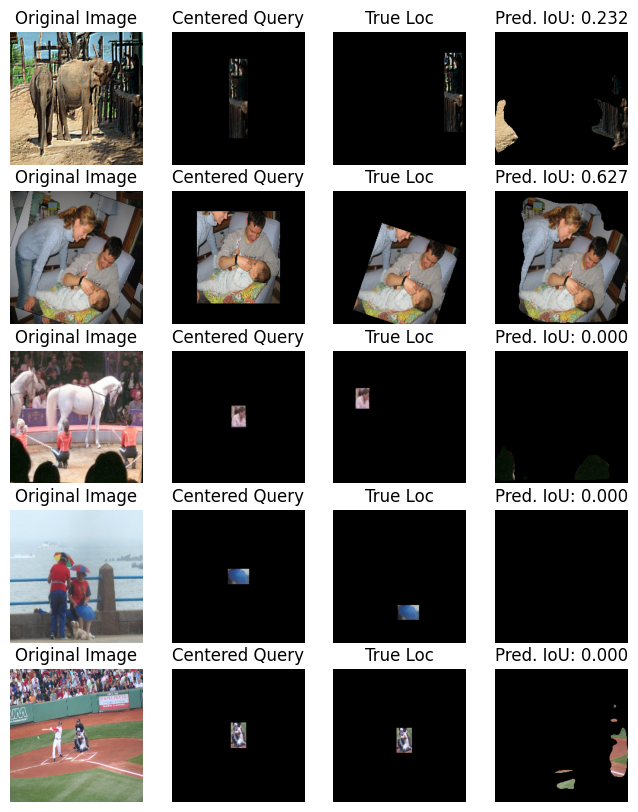


Epoch: 22
valid: 100%|██████████| 1094/1094 [01:53<00:00,  9.65it/s, dice_loss - 0.5037, iou_score - 0.356]


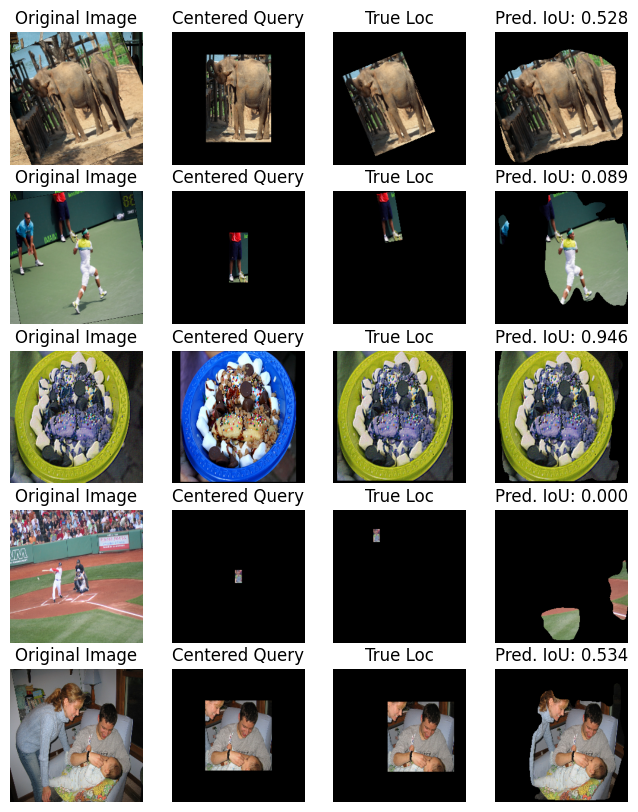


Epoch: 23
valid:  53%|█████▎    | 585/1094 [00:59<00:57,  8.93it/s, dice_loss - 0.4508, iou_score - 0.4077]

In [ ]:
from math import log
from torch.utils.data import DataLoader
import segmentation_models_pytorch.utils as smp_utils
from pathlib import Path

train_dataset = CustomCocoDataset(config=DataConfig(
    data_root='/content/coco/val2017',
    annotation_path='/content/coco/annotations/instances_val2017.json',
    image_size=(224, 224),
    min_query_hw=32,
    aug_rate=0.5,
    rotate_anlge=(-30,30),
    flip_rate=0.5,
    random_seed = 1000,
    max_data=-10,
    wrong_query_rate=0.2,
    train_size=0.9,
))
valid_dataset = CustomCocoDataset(config=DataConfig(
    data_root='/content/coco/val2017',
    annotation_path='/content/coco/annotations/instances_val2017.json',
    image_size=(224, 224),
    min_query_hw=32,
    aug_rate=0.5,
    rotate_anlge=(-30,30),
    flip_rate=0.5,
    random_seed = 1000,
    max_data=-10,
    wrong_query_rate=0.2,
    train_size=0.9,
    data_type=DataType.VALID,
))
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=True)


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

loss = smp_utils.losses.DiceLoss()
metrics = [
    smp_utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=0.0001),
])
# create epoch runners
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp_utils.train.TrainEpoch(
    model,
    loss=loss,
    metrics=metrics,
    optimizer=optimizer,
    device=device,
    verbose=True,
)

valid_epoch = smp_utils.train.ValidEpoch(
    model,
    loss=loss,
    metrics=metrics,
    device=device,
    verbose=True,
)

max_score = 0
EPOCHS = 100
log_images_every = 1
out_dir=Path('/content/drive/MyDrive/Msc Works/TempMatching/')
expt_name = 'exp1'
out_dir = out_dir/expt_name

if not out_dir.exists():
  out_dir.mkdir(parents=True, exist_ok=True)

for i in range(0, EPOCHS):

    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)

    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, str(out_dir/'best_model.pth'))
        print('Model saved!')

    if i == 25:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!')
    if i%log_images_every==0:
      idxs = np.random.choice(len(dataset), 5)
      res = []
      titles=[]
      for idx in idxs:
        imq, lbl = valid_dataset[idx]
        with torch.no_grad():
          pred = model(imq.unsqueeze(0).to(device))
        iou = smp_utils.metrics.IoU(threshold=0.5)
        iou_score = iou(pred, lbl.unsqueeze(0).to(device)).item()

        image = imq[0].permute(1,2,0).cpu().numpy()
        query = imq[1].permute(1,2,0).cpu().numpy()
        mask = lbl.squeeze(0,1).cpu().numpy()
        pred = pred.squeeze(0,1).cpu().numpy()
        image = valid_dataset.denormalization(image).astype(np.uint8)
        query = valid_dataset.denormalization(query).astype(np.uint8)
        mask = (mask*255).astype(np.uint8)
        pred = ((pred>0.5)*255).astype(np.uint8)
        true_position = image.copy()
        true_position[mask!=255] = 0
        pred_position = image.copy()
        pred_position[pred!=255] = 0
        res.extend([image, query, true_position, pred_position])
        titles.extend(['Original Image', 'Centered Query', "True Loc", f'Pred. IoU: {iou_score:0.3f}'])
        # break
      subplot_images(res, titles=titles, order=(-1,4), axis=False, fig_size=(8,10)).savefig(str(out_dir/f'epoch_{i}.png'))
      plt.show()


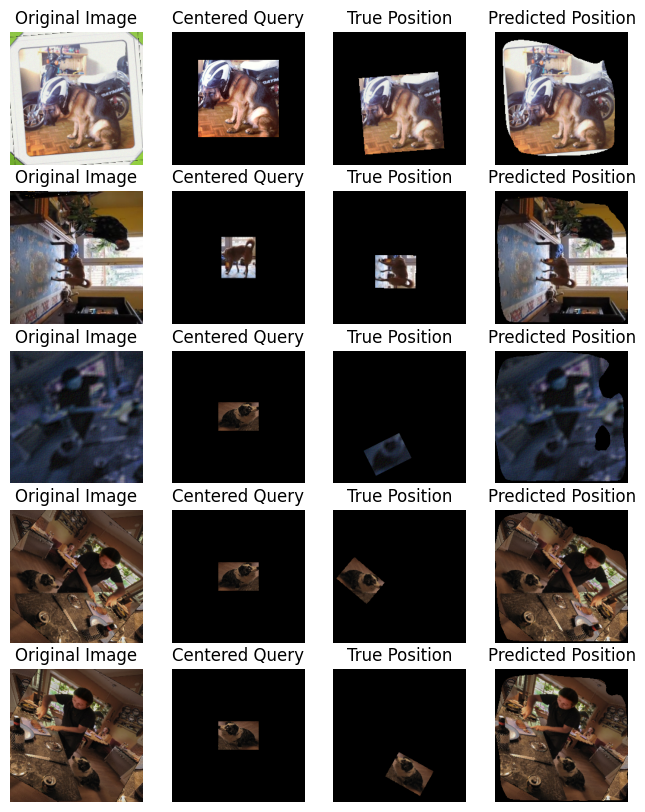

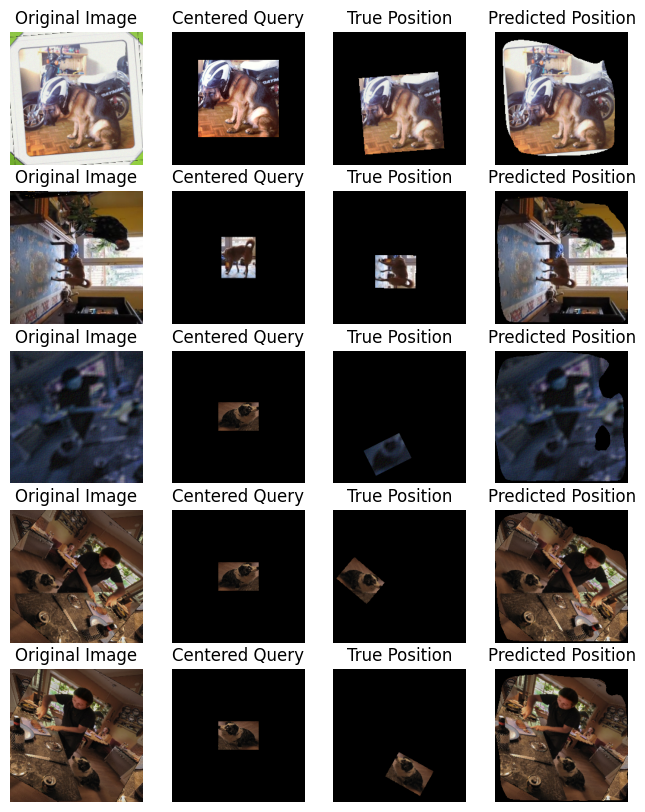

In [10]:
idxs = np.random.choice(len(dataset), 5)
res = []
titles=[]
for idx in idxs:
  imq, lbl = dataset[idx]
  with torch.no_grad():
    pred = model(imq.unsqueeze(0).to(device))
  iou = smp_utils.metrics.IoU(threshold=0.5)
  iou_score = iou(pred, lbl.unsqueeze(0).to(device)).item()

  image = imq[0].permute(1,2,0).cpu().numpy()
  query = imq[1].permute(1,2,0).cpu().numpy()
  mask = lbl.squeeze(0,1).cpu().numpy()
  pred = pred.squeeze(0,1).cpu().numpy()
  image = dataset.denormalization(image).astype(np.uint8)
  query = dataset.denormalization(query).astype(np.uint8)
  mask = (mask*255).astype(np.uint8)
  pred = ((pred>0.5)*255).astype(np.uint8)
  true_position = image.copy()
  true_position[mask!=255] = 0
  pred_position = image.copy()
  pred_position[pred!=255] = 0
  res.extend([image, query, true_position, pred_position])
  titles.extend(['Original Image', 'Centered Query', "True Position", 'Predicted Position'])
  # break
subplot_images(res, titles=titles, order=(-1,4), axis=False, fig_size=(8,10))


## Run Evaluation on Valid Data

In [118]:
import numpy as np
from typing import Tuple, Optional, Dict, Any
import torch
import json
import os
import cv2
from torch.utils.data import Dataset
from pydantic import BaseModel
from sklearn.model_selection import train_test_split
import albumentations as A
from enum import Enum
import warnings


def normalization(x):
    return x / 255


def denormalization(x):
    return x * 255


class DataConfig(BaseModel):
    data_root: str = r"D:/MSc Works/temp_matching/assets/training_data/val2017/val2017"
    annotation_path: str = (
        r"D:/MSc Works/temp_matching/assets/training_data/annotations_trainval2017/annotations/instances_val2017.json"
    )
    read_all_data: bool = True
    # w,h
    image_size: Tuple[int, int] = (224, 224)
    max_data: int = -1
    min_query_hw: int = 32


class CustomCocoDataset(Dataset):
    def __init__(
        self,
        config: DataConfig,
        normalization: callable = normalization,
        denormalization: callable = denormalization,
    ):
        """
        Custom Dataset to load images and their respective bounding boxes.

        Args:
            config (DataConfig): Configuration object containing dataset paths and parameters.
        """
        self.config = config
        self.data_root = config.data_root
        self.image_size = config.image_size
        self.normalization = normalization
        self.denormalization = denormalization
        # Load the annotation file and create the bounding box dictionary
        self.bbox_dict = self._load_annotations(config.annotation_path)
        bbox_keys = list(self.bbox_dict.keys())
        if config.max_data > 0:
            bbox_keys = bbox_keys[: config.max_data]
        self.keys = bbox_keys

    def _load_annotations(self, annotation_path: str) -> Dict[int, Tuple[Any, str]]:
        """
        Reads the annotation file and extracts bounding boxes with image paths,
        filtering out boxes smaller than min_query_hw.

        Args:
            annotation_path (str): Path to the annotation JSON file.

        Returns:
            bbox_dict (Dict[int, Tuple[Any, str]]): A dictionary mapping index to bounding box and image path.
        """
        with open(annotation_path, "r") as f:
            annotations = json.load(f)
        categories = {k["id"]: k["name"] for k in annotations["categories"]}
        bbox_dict = {}
        total_annotations = len(annotations["annotations"])
        print(f"Total annotations: {total_annotations}")
        selected_annotations = 0

        # Assuming COCO-style annotation structure
        for ann in annotations["annotations"]:
            bbox = ann["bbox"]  # Get the bounding box coordinates [x, y, width, height]
            x, y, w, h = map(int, bbox)
            lbl = categories[int(ann["category_id"])]
            ann_id = ann["id"]

            if (w >= self.config.min_query_hw) and (h >= self.config.min_query_hw):
                image_id = ann["image_id"]

                # Find the corresponding image file name
                image_info = next(
                    (img for img in annotations["images"] if img["id"] == image_id),
                    None,
                )

                if image_info:
                    image_path = os.path.join(self.data_root, image_info["file_name"])
                    # bbox_dict[idx] = (bbox, image_path)
                    if image_path not in bbox_dict:
                        bbox_dict[image_path] = []
                    bbox_dict[image_path].append([bbox, lbl, ann_id])
                selected_annotations += 1
            if (
                self.config.max_data > 0
                and len(bbox_dict) > self.config.max_data
                and not self.config.read_all_data
            ):
                break
        print(
            f"Total images: {len(bbox_dict)}, Num. Annotations: {selected_annotations}"
        )
        return bbox_dict

    def __len__(self):
        """Returns the total number of bounding boxes."""
        return (
            len(self.keys)
            if self.config.max_data < 0
            else min(len(self.keys), self.config.max_data)
        )

    def get_query_label(self, idx):
        image_path = self.keys[idx]
        bboxes = self.bbox_dict.get(image_path)

        if not os.path.exists(image_path) or bboxes is None:
            raise FileNotFoundError(f"Image not found: {image_path}")
            # return self.get_query_label(self.random_state.randint(0, len(self)))

        # Read the image using OpenCV
        image = cv2.imread(image_path)

        if image is None:
            raise FileNotFoundError(f"Image not found: {image_path}")

        if len(bboxes) == 0:
            return (
                image,
                np.zeros_like(image),
                np.zeros(image.shape[:2], dtype=np.uint8),
            )

        pairs = []
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        for bbox, lbl, ann_id in bboxes:
            x, y, w, h = map(int, bbox)

            # Create a mask of the same size as the original image, initialized to zeros
            mask = np.zeros(image.shape[:2], dtype=np.uint8)

            # Mark the area of the bounding box in the mask
            mask[y : y + h, x : x + w] = 255

            # Crop the region of the bounding box from the original image
            cropped_region = image[y : y + h, x : x + w]

            # Create a black image of the same size as the original
            query = np.zeros_like(image)

            # Calculate center positions to place the cropped region
            centered_x = (query.shape[1] - w) // 2
            centered_y = (query.shape[0] - h) // 2

            # Place the cropped region in the center of the black image
            query[centered_y : centered_y + h, centered_x : centered_x + w] = (
                cropped_region
            )

            pairs.append(
                (
                    image,
                    query,
                    mask,
                    cropped_region,
                    lbl,
                    image_path,
                    (x, y, w, h),
                    ann_id,
                )
            )

        return pairs

    def __getitem__(self, index: int) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """
        Fetches the original image, the query (centered cropped region), and the mask.

        Args:
            index (int): The index of the bounding box.

        Returns:
            Tuple[np.ndarray, np.ndarray, np.ndarray]: Original image, query (centered cropped region), and mask.
        """
        pairs = self.get_query_label(index)
        return pairs

In [119]:
from benchmarking import Evaluator, normalization
from pathlib import Path


dl = CustomCocoDataset(DataConfig())
evaluator = Evaluator(
    model_path=Path(
        r"D:\MSc Works\temp_matching\train_res\2024-09-24\best_model_state_dict.pth"
    )
)

Total annotations: 36781
Total images: 4859, Num. Annotations: 21627


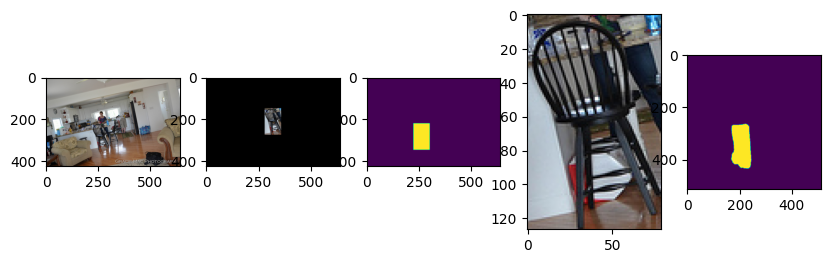

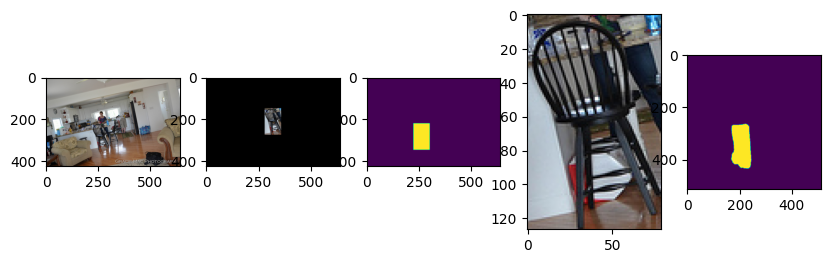

In [122]:
sample1 = dl[105][0]
# evaluator.set_query(sample1[3], sample1[0])
out = evaluator.fast_predict(sample1[0], sample1[3])

subplot_images([sample1[0], sample1[1], sample1[2], sample1[3], 255*(out>0.5).astype(np.uint8)], order=(1, -1), axis=True)

In [121]:
sample1[3].shape

(91, 33, 3)

## View Comparisons: SIFT vs Template Matching Model

In [123]:
import pandas as pd

# Read the CSV file, skipping the first row
df = pd.read_csv(r"D:\MSc Works\temp_matching\assets\model_results2\results.csv")

# Rename the columns
# df.columns = ['image_name', 'label', 'bbox', 'iou', 'ann_id', 'model_time', 'model_gpu_memory', 'model_memory', 'sift_iou', 'sift_time']

# f"{image_names[i]},{lbl},{bboxes[i]},{iou},{ann_ids[i]},{model_pred.time/len(masks)},{model_pred.gpu_memory/len(masks)},{model_pred.memory/len(masks)},{sift_iou},{sift_time}\n"
df.columns = ['image_name', 'label', 'bbox', 'model_iou', 'ann_id', 'model_time', 'model_gpu_memory', 'model_memory', 'sift_iou', 'sift_time']

print(",".join([c for c in df.columns]))

image_name,label,bbox,model_iou,ann_id,model_time,model_gpu_memory,model_memory,sift_iou,sift_time


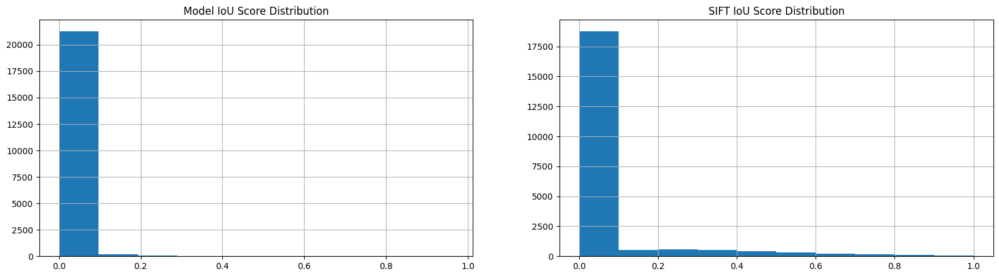

In [124]:
fig, ax = plt.subplots(1, 2, figsize=(20, 5))
df.model_iou.hist(ax=ax[0])
df.sift_iou.hist(ax=ax[1])
ax[0].set_title("Model IoU Score Distribution")
ax[1].set_title("SIFT IoU Score Distribution")
# plt.ylim(0, 100)
plt.show()


<Axes: ylabel='Frequency'>

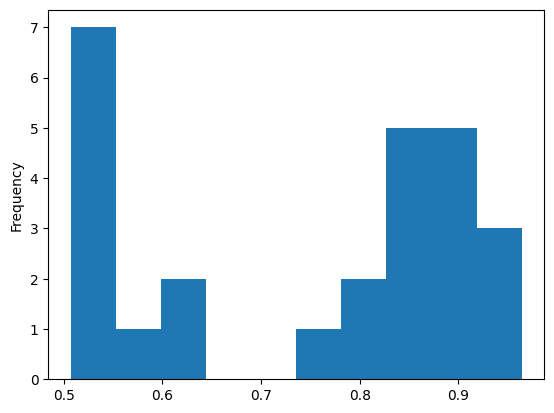

In [126]:
df.query('model_iou>0.5').model_iou.plot(kind='hist')